# Tutorial: Source Separation using NMF

## Introduction
This tutorial introduces the concept of source separation using Non-negative Matrix Factorization (NMF). Source separation involves isolating individual audio sources from a composite signal. NMF is a powerful technique for this purpose due to its ability to decompose a signal into its constituent parts, in an unsupervised fashion.

## Objective
By the end of this tutorial, you will understand how to apply NMF to separate sources from a mixed audio signal.

## Prerequisites
- Basic understanding of Python programming.
- Familiarity with linear algebra concepts.
- Installed Python environment with Jupyter Notebook.
- Required Python libraries: see the requirements.txt. This tutorial has been tested by installing `nmf_bioacoustics` using the command `pip install -e <path_to_the toolobox_on_your_machine>`.


## Conceptual Overview
NMF decomposes a non-negative data matrix into the product of two lower-rank non-negative matrices, often interpreted as the features and coefficients. In the context of audio, this allows us to separate original sources from a mixed signal.

# Let's dive into the code!
First, imports and parameters.

In [ ]:
## Code to set up the virtual environment
# !pip install -r ../requirements.txt
# !pip install -e ..

## Download the AnuraSet dataset: visit https://zenodo.org/records/8342596
## Set up the path to the dataset here
anuraset_path = "/home/a23marmo/datasets/anuraset" # TO CHANGE

In [1]:
## Imports
from nmf_bioacoustic.datasets.anuraset import AnuraSet # Loader for the AnuraSet dataset

import nmf_bioacoustic.tasks.source_separation as source_sep # The scripts for listening to the separated sources
from nmf_bioacoustic.utils.signal_to_spectrogram import FeatureObject # An object containing all details for the spectrogram computation

from nn_fac.nmf import nmf as nn_fac_nmf # Code for NMF

from nmf_bioacoustic.utils import audio_helper # High level function to listen to audio files from spectrograms

# Plotting functions
from librosa.display import specshow
import matplotlib.pyplot as plt

In [2]:
## Signal parameters
sr = 16000
hop_length = 2048
n_fft = hop_length * 2
feature = "stft_complex"

## Creating the feature object
feature_object = FeatureObject(sr, feature, hop_length, n_fft=n_fft)

# Loading the dataset
dataset = AnuraSet(audio_path=f"{anuraset_path}/raw_data/INCT17", annotations_file=f"{anuraset_path}/weak_labels.csv", 
                   feature_object=feature_object)

# Loading a specific file
file_name = "INCT17_20191113_040000.wav"

# NMF parameters
n_nmf = 3
beta = 1

if beta == 2:
    nmf_algo = "hals"
else:
    nmf_algo = "mu"

Now, let's compute the spectrogram.

Original spectrogram


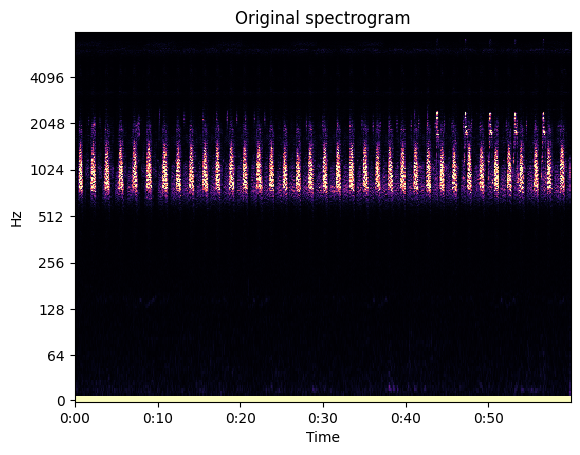

In [3]:
## Computing the spectrogram
if feature == "stft_complex":
    (spec, phase), annotations = dataset.get_item_of_id(file_name)
else:
    spec, annotations = dataset.get_item_of_id(file_name)

## Listen and plot the spectrogram
print("Original spectrogram")
audio_helper.listen_to_this_spectrogram(spec, feature_object, phase_retrieval = "original_phase", original_phase = phase)

fig, ax = plt.subplots()
ax.set_title("Original spectrogram")
img = specshow(spec, sr=sr, hop_length=hop_length, y_axis="log", x_axis = 'time', vmax=10) # specshow(W@H, sr=sr, hop_length=hop_length, y_axis="log")
# Save this figure as a png, with transparent background
# plt.savefig("imgs/original_spectrogram.png", transparent = True)
plt.show()

Now, let's compute NMF.

In [4]:
import time # Time the computation
start = time.time()

# Actually compute NMF
W, H = nn_fac_nmf(spec, n_nmf, init = "nndsvd", n_iter_max=100, tol=1e-8,
        update_rule = nmf_algo, beta = beta,
        normalize=[False, True],
        verbose=False, return_costs=False, deterministic=True)

print(f"NMF computation done in {time.time() - start} seconds.")

NMF computation done in 5.10251522064209 seconds.


In [5]:
## Listen to the separated sources
source_list = source_sep.evaluate_source_separation(W, H, time_limit=None,feature_object=feature_object, phase_retrieval="original_phase", phase=phase)

Whole mixture:


Source: 0


Source: 1


Source: 2


Plotting zone!

Below you will find the spectrograms of the NMF outputs and of the separated sources.

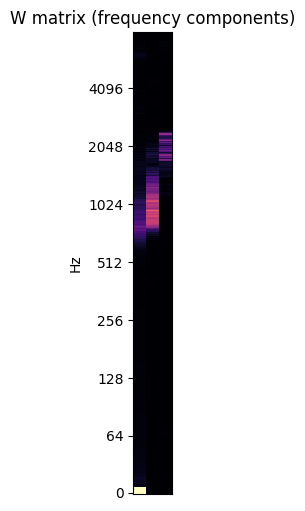

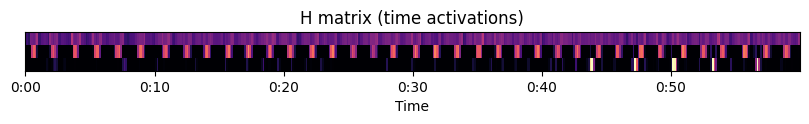

In [6]:
# Plot the spectrograms of the W and H matrices
fig, ax = plt.subplots(figsize=(0.5, 6))
img = specshow(W, sr=sr, hop_length=hop_length, y_axis="log", vmax=5)
ax.set_title("W matrix (frequency components)")
# plt.savefig("imgs/W.png", transparent = True)
plt.show()

fig, ax = plt.subplots(figsize=(10,0.5))
img = specshow(H[::-1], sr=sr, hop_length=hop_length, x_axis="time", vmax=5)
ax.set_title("H matrix (time activations)")
# plt.savefig("imgs/H.png", transparent = True)
plt.show()

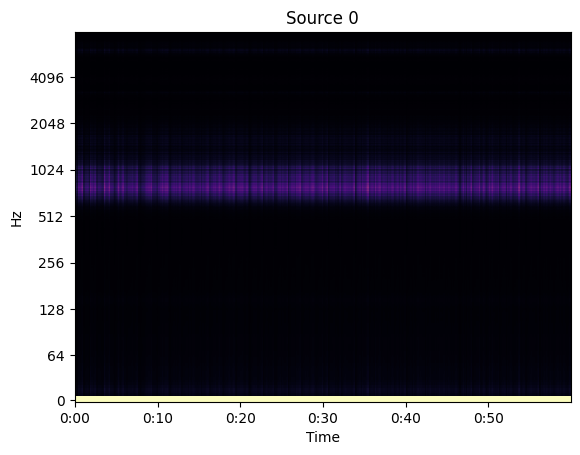

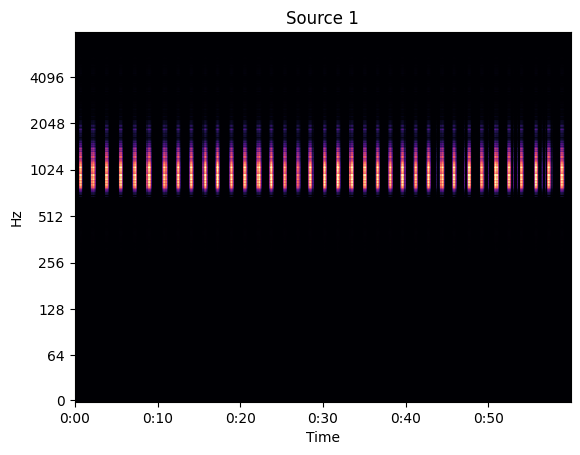

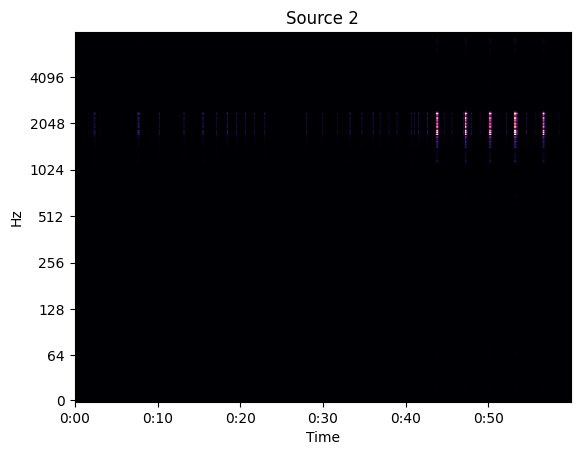

In [7]:
## Plot the spectrogram of each source
for idx, a_source in enumerate(source_list):
    fig, ax = plt.subplots()
    img = specshow(a_source, sr=sr, hop_length=hop_length, y_axis="log", x_axis="time", vmax=10) # specshow(W@H, sr=sr, hop_length=hop_length, y_axis="log")
    ax.set_title(f"Source {idx}")
    # plt.savefig(f"imgs/source_{idx}.png", transparent = True)
    plt.show()